# Experiments for Bigram Transition and Causality Data

In [1]:
using Random
Random.seed!(42);

In [2]:
include("./src/Misc.jl");
include("./src/Datasets.jl");
include("./src/NMF/NMF.jl");
include("./src/sNMF/sNMF.jl");
include("./src/CP/CP.jl");
include("./src/NCP/NCP.jl");
include("./src/FCG/FCG.jl");
include("./src/ACP/ACP.jl");
using .sNMF, .NMF, .Misc, .Datasets, .ACP, .NCP, .FCG
using LinearAlgebra, NPZ
using PyPlot, PyCall
using Distributions, Plots, SpecialFunctions
using JLD, FileIO, Dates, JSON
using Base.Iterators: flatten
import NMF: nnmf
@pyimport matplotlib.pyplot as plt_org
@pyimport string as st
letters = st.ascii_lowercase;
pl = PyPlot;
PyPlot.rc("font", size=10)

#### Functions for visualisation

In [7]:
function plot_letters(X::Array{Float64,2}, desired_order::String; savefig=true)
    pl.figure(figsize=(7,7))
    pl.imshow(X)
    pl.xticks(0:25, desired_order)
    pl.yticks(0:25, desired_order);
    #pl.title("Letter Transition Matrix (\$X\$ to \$Y\$ Transitions)");
    if savefig
        pl.savefig(string("img/",title,".pdf"), format="pdf")
    end
end                                                           

function plot_comparison(Rs, log_Z_nmf, log_Z_vb, log_Z_fcg, title; figsize=(5,3), savefig=true, filename="", omit_vb=false)
    plt_org.figure(figsize=figsize)    
    plt_org.plot(Rs, log_Z_nmf, label="CP SMC", marker="o")
    plt_org.plot(Rs, log_Z_fcg, label="CG \$ \\log \\mathcal{L}_{X}\$")
    if ~omit_vb
        plt_org.plot(Rs, log_Z_vb, label="CP ELBO", marker="v", color="red")
    end
    plt_org.ylabel("\$ \\log \\mathcal{L}_X(R) \$")
    plt_org.xlabel("\$R\$ (Model order)")
    plt_org.xticks([5,10,15])
    plt_org.ylim(-2.8e4, 0)
    plt_org.legend()
    plt_org.ticklabel_format(style="sci",axis="y", scilimits=(0,0))
    plt_org.title(title)
    plt_org.show()
    #plt_org.tight_layout()
    if savefig
        if filename == ""
            filename=title
        end
        plt_org.savefig(string("img/",filename,".pdf"), format="pdf", bbox_inches="tight")
    end
end;

function plot_comparison(Rs, log_Z_nmf, log_Z_snmf, title; figsize=(5,3))
    plt_org.figure(figsize=figsize)    
    plt_org.plot(Rs, log_Z_nmf, label="NMF \$ \\log p(X)\$", marker="o")
    plt_org.plot(Rs, log_Z_snmf, label="sNMF \$ \\log p(X)\$", marker="o")
    plt_org.ylabel("\$ \\log \\mathcal{L}_X(R) \$")
    plt_org.xlabel("\$R\$ (Model order)")
    plt_org.xticks(Rs[1:2:end])
    plt_org.legend()
    plt_org.title(title)
    plt_org.show()
end

function plot_comparison(Rs, log_Z_nmf, log_Z_snmf, log_Z_vb, log_Z_svb, title; figsize=(5,3), savefig=true, filename="")
    plt_org.figure(figsize=figsize)    
    plt_org.plot(Rs, log_Z_nmf, label="NMF SMC", marker="o", markersize=4)
    plt_org.plot(Rs, log_Z_snmf, label="sNMF SMC", marker="o", markersize=4)
    plt_org.plot(Rs, log_Z_vb, label="NMF ELBO", marker="v", markersize=4)
    plt_org.plot(Rs, log_Z_svb, label="sNMF ELBO", marker="v", markersize=4)
    plt_org.ylabel("\$ \\log \\mathcal{L}_X(R) \$")
    plt_org.xlabel("\$R\$ (Model order)")
    plt_org.xticks([5,10,15,20,25,30,35,40,45,50])
    plt_org.ylim(-3.2e3, -1.3e3)
    plt_org.legend()
    plt_org.title("B")
    plt_org.ticklabel_format(style="sci",axis="y", scilimits=(0,0))
    #plt_org.tight_layout()
    plt_org.title(title)
    plt_org.show()
    if savefig
        if filename == ""
            filename=title
        end
        plt_org.savefig(string("img/",filename,".pdf"), format="pdf", bbox_inches="tight")
    end
end;

function plot_distributions(allocs, R, Z=10; filename="rings.pdf", separate_plots=false)
    """
    Allocs is an array with two columns with the first including the latent variable, 
    the second including the extraneous variable under examination
    """
    N = size(allocs)[1]
    df = zeros(N, 2)
    for i in 1:N
        df[i,1] = allocs[i][end-1]
        df[i,2] = allocs[i][end]
    end
    plt_org.figure()
    for r in 1:R
        if separate_plots
            plt_org.figure()
        end
        plt_org.hist(df[df[:,1].==r,2], bins=[i for i in 1:Z+1].-0.5, alpha=0.2);
    end
    plt_org.xlabel("Number of rings (categories)")
    plt_org.ylabel("Number of observations")
    plt_org.savefig(string("img/", filename), format="pdf", bbox_inches="tight")
    return df
end

letters = "abcdefghijklmnopqrstuvwxyz"
desired_order = "aeioubcdfghjklmnpqrstvwxyz"
desired_ix = [1,5,9,15,21,2,3,4,6,7,8,10,11,12,13,14,16,17,18,19,20,22,23,24,25,26];  

#### Functions for obtaining marginal likelihoods

In [4]:
function experiment_nmf(X::Array, γ, Rs, N, M; adaptive=true, symmetric=false, extra_var=false, use_ncp=false)
    if extra_var
        X_full = deepcopy(X)
        X = sum(X_full, length(size(X_full)))
    end
    len_R, μ = length(Rs), nanmean(X)
    μ = μ == 0. ? 0.1 : μ
    a = γ * reduce(*, size(X))
    params = Dict(:μ=>μ, :γ=>γ, :adaptive=>adaptive)
    if extra_var
        method = ACP
        params = Dict(:a=>a)
    elseif (typeof(X) == Array{Float64, 4}) | (use_ncp == true)
        method = NCP
        params = Dict(:a=>a)
    elseif typeof(X) == Array{Float64, 2}
        method = NMF
        if symmetric
            method=sNMF
        end
    elseif typeof(X) == Array{Float64, 3}
        method = CP
    else
        println("Array type not recognized.")
    end
    if extra_var
        res = reshape([ret for R=Rs, m=1:M for ret=method.smc_weight(X_full, R, N; params...)],3,len_R,M)
    else
        res = reshape([ret for R=Rs, m=1:M for ret=method.smc_weight(X, R, N; params...)],3,len_R,M)
    end
    log_Z, S = Array{Real}(res[1,:,:]), Array{method.Particle}(res[3,:,:])
    S = S[argmax(log_Z, dims=2)]
    return log_Z , S[:]
end

function experiment_vb(X::Array, γ, Rs, EPOCHS, M; symmetric=false, extra_var=false, use_ncp=false, use_wild_vb=false)
    if extra_var
        X_full = deepcopy(X)
        X = sum(X_full, length(size(X_full)))
    end
    len_R, μ = length(Rs), nanmean(X)
    μ = μ == 0. ? 0.1 : μ
    a = γ * reduce(*, size(X))
    no_outputs = 4
    params = Dict(:μ=>μ, :γ=>γ, :EPOCHS=>EPOCHS)
    if extra_var
        method = ACP
        params = Dict(:a=>a)
    elseif (typeof(X) == Array{Float64, 4}) | (use_ncp == true)
        method = NCP
        params = Dict(:a=>a, :EPOCHS=>EPOCHS)
        no_outputs = 3                           
    elseif typeof(X) == Array{Float64, 2}
        method = NMF
        if symmetric
            method=sNMF
        end
    elseif typeof(X) == Array{Float64, 3}
        method = CP        
    else
        println("Array type not recognized.")
    end
    if use_wild_vb
        method = Main
    end                                        
    if extra_var
        res = reshape([ret for R=Rs, m=1:M for ret=method.standard_VB(X_full, R; params...)],no_outputs,len_R,M)
    else
        res = reshape([ret for R=Rs, m=1:M for ret=method.standard_VB(X, R; params...)],no_outputs,len_R,M)
    end
    logW = [res[1,R,m][end] for R=1:length(Rs), m=1:M]
    thetas = [res[no_outputs,R,m] for R=1:length(Rs), m=1:M]
    for R in 1:length(Rs)
        #println(res[1,R,1])
    end
    best_bound = argmax(logW, dims=2)
    log_Z = logW[best_bound]
    theta = thetas[best_bound]
    return log_Z[:], theta
end;                                                                                   

#### High level comparison functions

In [5]:
function results_write_json(results, file_name)
    if "datetime" in keys(results)
        results["datetime"] = Dates.now()
    end
    results = JSON.json(results)
    open(file_name, "w") do f
        write(f, results)
    end
end

function compare_vb_svb(X, Rs, γ, N, M, EPOCHS; use_ncp=false)
    log_Z_vb, theta_vb = experiment_vb(X, γ, Rs, EPOCHS, M; use_ncp=use_ncp)
    log_Z_svb, theta_svb = experiment_vb(X, γ, Rs, EPOCHS, M; symmetric=true)
    return log_Z_vb, log_Z_svb, theta_vb, theta_svb
end
                                                                                                                            
function compare_nmf_snmf(X, Rs, a, N, M, EPOCHS; plot=true, adaptive=true, use_ncp=false)
    γ = a / reduce(*, size(X)) 
    log_Z_nmf, S_nmf = experiment_nmf(X, γ, Rs, N, M; adaptive=adaptive, use_ncp=use_ncp)
    log_Z_snmf, S_snmf = experiment_nmf(X, γ, Rs, N, M; adaptive=adaptive, symmetric=true)
    log_Z_vb, log_Z_svb, theta_vb, theta_svb = compare_vb_svb(X, Rs, γ, N, M, EPOCHS)
    log_Z_nmf = logsumexp(log_Z_nmf, 2) .- log(M)
    log_Z_snmf = logsumexp(log_Z_snmf, 2) .- log(M);
    if plot
        title = string("Bigram Data Set", " (\$a=\$", a, ")")
        plot_comparison(Rs, log_Z_nmf, log_Z_snmf, log_Z_vb, log_Z_svb, title)
    end
    return log_Z_nmf, log_Z_snmf, log_Z_vb, log_Z_svb, S_nmf, S_snmf, theta_vb, theta_svb
end
                                
function compare_nmf_fcg(X, Rs, a, N, M, EPOCHS; plot=true, dataset_name="", extra_var=false, adaptive=true, use_ncp=false, omit_vb=false, use_wild_vb=false)
    title = dataset_name * " \$ (a=\$" * string(a) * ")" # " - CP vs. CG" *
    if extra_var
        X_full = deepcopy(X)
        X = sum(X_full, length(size(X_full)))
    end
    γ = a / reduce(*, size(X))
    if extra_var
        log_Z_nmf, S_nmf = experiment_nmf(X_full, γ, Rs, N, M; adaptive=adaptive, extra_var=extra_var)
    else
        log_Z_nmf, S_nmf = experiment_nmf(X, γ, Rs, N, M; adaptive=adaptive, extra_var=extra_var, use_ncp=use_ncp)
    end
    log_Z_nmf = logsumexp(log_Z_nmf, 2) .- log(M)
    logpx = FCG.log_marginal(X)
    log_Z_fcg = fill(logpx, length(Rs));
    if omit_vb
        log_Z_vb, theta_vb = log_Z_nmf, S_nmf
    else 
        if extra_var
            log_Z_vb, theta_vb = log_Z_fcg, []
        else
            log_Z_vb, theta_vb = experiment_vb(X, γ, Rs, EPOCHS, M; use_ncp=use_ncp, use_wild_vb=use_wild_vb)
        end
    end
    if plot
        plot_comparison(Rs, log_Z_nmf, log_Z_vb, log_Z_fcg, title;omit_vb=omit_vb)
    end
    return log_Z_nmf, log_Z_vb, log_Z_fcg, S_nmf, theta_vb

end    

compare_nmf_fcg (generic function with 1 method)

In [6]:
function standard_VB(X::Array{ℜ,N}, R::Ƶ; a=1.0, b=a/nansum(X), EPOCHS::Ƶ=1, ϵ=1e-16) where {ℜ<:Real, Ƶ<:Int, N}
    I = size(X)
    
    S_R, S₊ = fill(a/R,R), sum(X)
    S_I = [fill(a/(R*Iₙ),R,Iₙ) for Iₙ in I]
    
    log_λ = digamma(S₊ + a) - log(b + 1)
    log_θ_R = log.(rand(Dirichlet(R,a/R + 0.1)))
    log_θ_I = [log.(rand(Dirichlet(Iₙ,a/(R*Iₙ) + 0.1),R)) for Iₙ in I]
    
    log_C = a*log(b) - (a + S₊)*log(b + 1) + lgamma(a + S₊) - lgamma(a) - sum(lgamma, X .+ 1)
                                                    
    s, log_p = Array{ℜ}(undef,R), Array{ℜ}(undef,R)
    ELBO::Array{ℜ} = fill(log_C,EPOCHS)          

    for eph=1:EPOCHS
        # initialization
        S_R .= a/R
        for n ∈ 1:N
            S_I[n] .= a/(R*I[n])
        end
        
        # expectation of S
        for i ∈ NCP.EventQueue(X)
            log_p .= log_θ_R 
            for n ∈ 1:N
                log_p .+= log_θ_I[n][i[n],:]
            end
            
            log_p .-= logsumexp(log_p)
            s .= exp.(log_p)
            
            S_R .+= s
            for n ∈ 1:N
                S_I[n][:,i[n]] .+= s
            end
            
            ELBO[eph] -= sum(s .* log_p)
        end
                                 
        log_θ_R .= digamma.(S_R) .- digamma(S₊ + a)
        ELBO[eph] += lbeta(S_R) - lbeta(a/R,R)
        for n ∈ 1:N
            log_θ_I[n] .= digamma.(S_I[n])' .- digamma.(S_R)'
            ELBO[eph] += sum(lbeta(S_I[n];dims=2)) - R*lbeta(a/(R*I[n]),I[n])
        end
        
    end
    return ELBO, log_λ, (log_θ_R, log_θ_I)
end

standard_VB (generic function with 1 method)

## Experiments for Bigram Transition Data

In [38]:
X = Datasets.ngram(2,2000)
X = Array(X')[desired_ix, desired_ix];

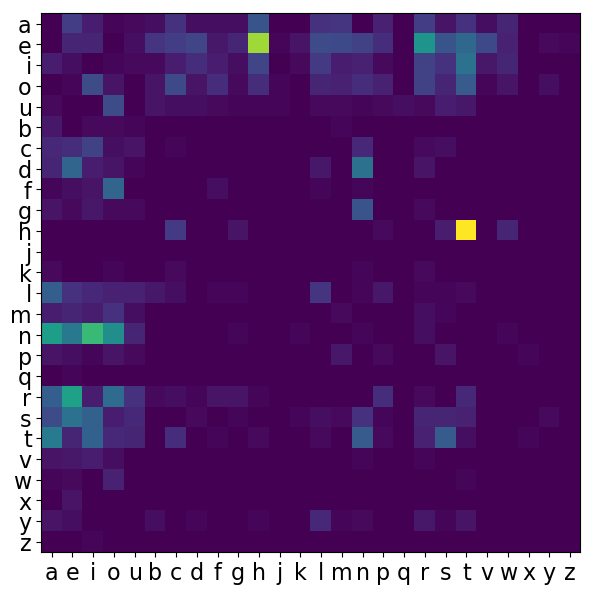

In [39]:
plot_letters(X, desired_order);

In [40]:
results = Dict()

Dict{Any,Any} with 0 entries

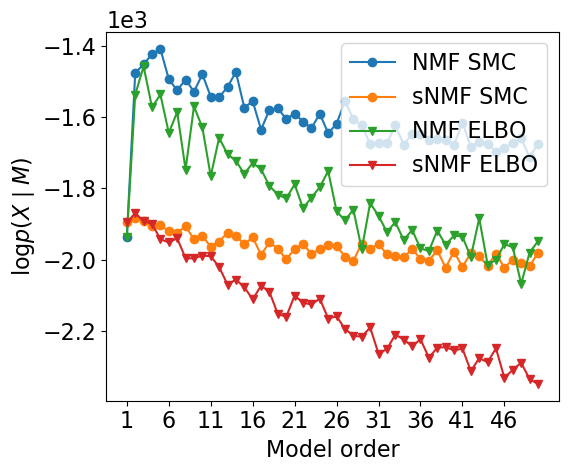

In [42]:
Rs, N, M, EPOCHS, a = 1:50, 1000, 10, 300, 1;
results["a_1"] = compare_nmf_snmf(X, Rs, a, N, M, EPOCHS);

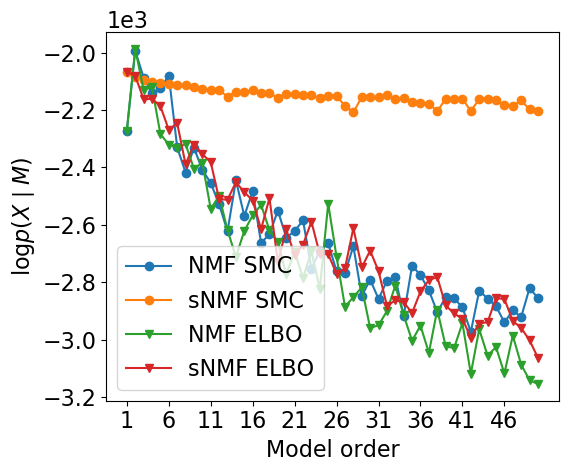

In [43]:
Rs, N, M, EPOCHS, a = 1:50, 1000, 10, 300, 0.001;
results["a_0_001"] = compare_nmf_snmf(X, Rs, a, N, M, EPOCHS);

In [44]:
file_name = "./results/bigram_results"
save(File(format"JLD",file_name * ".jld"),"results",results, "datetime", Dates.now())
results_write_json(results, file_name * ".txt")

LoadError: syntax: extra token ")" after end of expression

### For plotting the bigram data

In [86]:
bigram = JLD.load("./results/bigram_results.jld")
results = bigram["results"];
Rs=1:50;

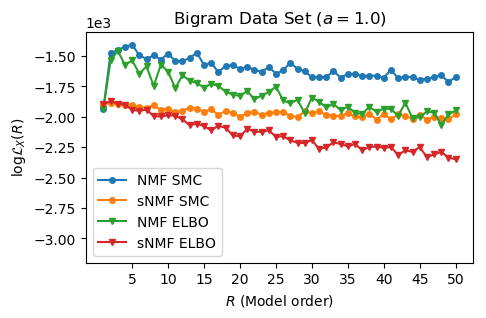

In [90]:
log_Z_nmf, log_Z_snmf, log_Z_vb, log_Z_svb, S_nmf, S_snmf, theta_vb, theta_svb = results["a_1"];
a = 1.
title = string("Bigram Data Set", " (\$a=\$", a, ")")
plot_comparison(Rs, log_Z_nmf, log_Z_snmf, log_Z_vb, log_Z_svb, title)

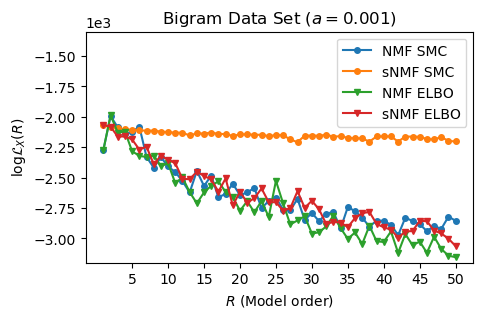

In [94]:
log_Z_nmf, log_Z_snmf, log_Z_vb, log_Z_svb, S_nmf, S_snmf, theta_vb, theta_svb = results["a_0_001"];
a = 0.001
title = string("Bigram Data Set", " (\$a=\$", a, ")")
plot_comparison(Rs, log_Z_nmf, log_Z_snmf, log_Z_vb, log_Z_svb, title)

## Causality experiments with Abalone dataset: fully connected graph vs. CP

In [59]:
Random.seed!(242);

Experiments with the whole tensor

In [60]:
Datasets.descriptions["Abalone"] = DataDesc("data/abalone/abalone.data",
                         [:sex, :length, :diameter, :height, :whole, :shucked, :viscera, :shell, :rings],
                         [3,5,5,5,5,5,5,5,29],
                         [String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int]);

In [61]:
X = Datasets.load("Abalone", [:length, :diameter, :height, :whole, :shucked, :viscera, :shell]);
X = convert(Array{Float64, 7}, X)
dataset_name = "Abalone Data Set"

"Abalone Data Set"

In [55]:
results = Dict()

Dict{Any,Any} with 0 entries

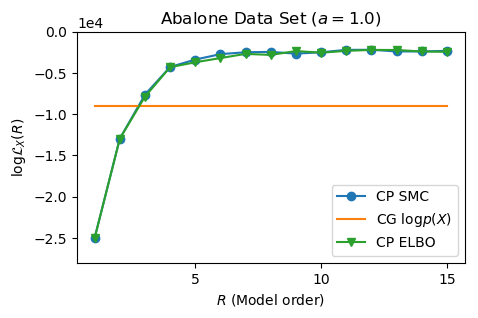

In [62]:
Rs, N, M, EPOCHS, a = 1:15, 100, 10, 50, 1.;
results["a_1"] = compare_nmf_fcg(X, Rs, a, N, M, EPOCHS; plot=true, dataset_name=dataset_name, extra_var=false, use_ncp=true, omit_vb=false, use_wild_vb=true);

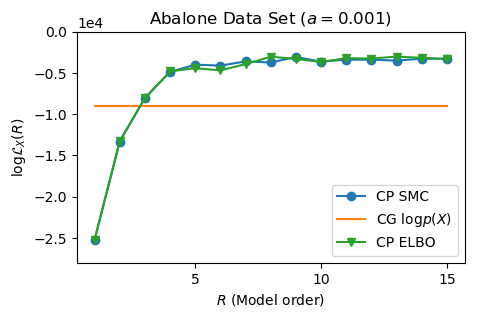

In [63]:
Rs, N, M, EPOCHS, a = 1:15, 100, 10, 50, 0.001;
results["a_0_001"] = compare_nmf_fcg(X, Rs, a, N, M, EPOCHS; plot=true, dataset_name=dataset_name, extra_var=false, use_ncp=true, omit_vb=false, use_wild_vb=true);

In [21]:
X = Datasets.load("Abalone", [:length, :diameter, :height, :whole, :shucked, :viscera, :shell, :rings]);
X = convert(Array{Float64, 8}, X)
dataset_name = "Abalone All"

"Abalone All"

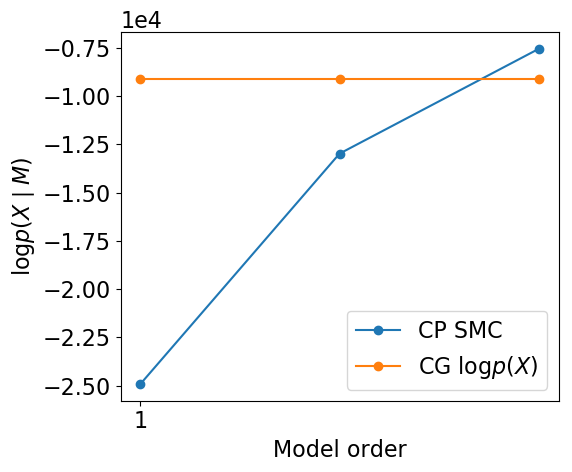

In [22]:
Rs, N, M, EPOCHS, a = 1:3, 10, 10, 300, 1;
results["a_1_alloc"] = compare_nmf_fcg(X, Rs, a, N, M, EPOCHS; plot=true, dataset_name=dataset_name, extra_var=true,omit_vb=true);

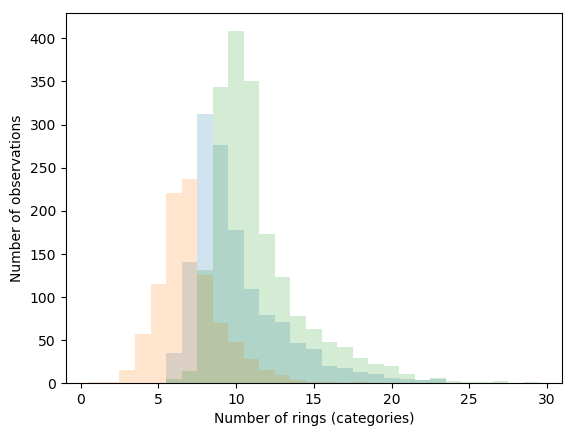

In [12]:
R = 3
Z = 29
df = plot_distributions(results["a_1_alloc"][4][R].allocations, R, Z; filename="weight_rings.pdf", separate_plots=false);

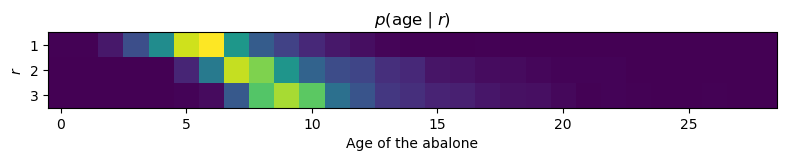

In [21]:
cm = zeros(3,29);
for i in 1:size(df)[1]
    cm[Int(df[i, 1]), Int(df[i, 2])] += 1
end
cm_norm = cm ./ sum(cm, dims=2);
cm_norm = cm_norm[[2,1,3], :] 
#cm_norm = cm[[2,1,3], :] 
PyPlot.figure(figsize=(8,2))
PyPlot.imshow(cm_norm);
PyPlot.yticks([0,1,2], [1,2,3]);
PyPlot.xlabel("Age of the abalone")
PyPlot.ylabel("\$r\$")
PyPlot.title("\$p(\$age\$ \\mid r)\$")
PyPlot.tight_layout()
PyPlot.savefig("./img/p_age_k.pdf", format="pdf")

In [57]:
#abalone_all = JLD.load("./results/abalone_all.jld")
#results = abalone_all["results"]

Dict{String,Any} with 2 entries:
  "datetime" => 2019-03-05T08:50:16.944
  "results"  => Dict{Any,Any}("a_1000"=>([-25839.7, -18755.3, -15484.4, -12724.…

In [8]:
file_name = "./results/abalone_all"
JLD.save(File(format"JLD",file_name * ".jld"),"results",results, "datetime", Dates.now())
results_write_json(results, file_name * ".txt")

UndefVarError: UndefVarError: results not defined

In [9]:
abalone_all = JLD.load("./results/abalone_all.jld")
results = abalone_all["results"];
Rs=1:15;

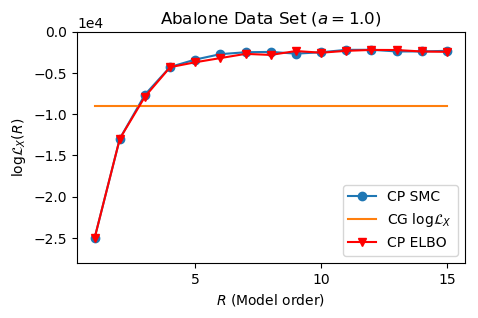

In [10]:
log_Z_nmf, log_Z_vb, log_Z_fcg, S_nmf, theta_vb = results["a_1"];
dataset_name = "Abalone Data Set"
a = 1.
title = dataset_name * " \$ (a=\$" * string(a) * ")" # " - CP vs. CG" *
plot_comparison(Rs, log_Z_nmf, log_Z_vb, log_Z_fcg, title)

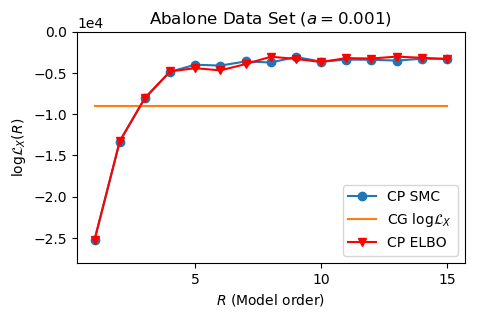

In [11]:
log_Z_nmf, log_Z_vb, log_Z_fcg, S_nmf, theta_vb = results["a_0_001"];
dataset_name = "Abalone Data Set"
a = 0.001
title = dataset_name * " \$ (a=\$" * string(a) * ")" # " - CP vs. CG" *
plot_comparison(Rs, log_Z_nmf, log_Z_vb, log_Z_fcg, title)

## Comparing decompositions obtained through different methods

In [116]:
Random.seed!(242);

In [117]:
function get_nnmf(X,R)
   result=nnmf(X,R)
   return result.W, result.H 
end

function experiment_nmf(X::Array, γs, R, N, M, bogus; adaptive=true, get_decomp=true, if_as=true)
    R = Int(R)
    len_γ, μ = length(γs), nanmean(X)
    μ = μ == 0. ? 0.1 : μ
    res = reshape([ret for γ=γs, m=1:M for ret=NMF.smc_weight(X, R, N; μ=μ, γ=γ, adaptive=adaptive)],3,len_γ,M)                
    log_Z, S = Array{Real}(res[1,:,:]), Array{NMF.Particle}(res[3,:,:])
    S = S[argmax(log_Z, dims=2)]
    res = reshape([ret for i=1:length(γs) for ret=get_decomposition(S[i], γs[i])], 2,len_γ)
    return res
end
                                
function experiment_vb(X::Array{Float64, 2}, γs, R, EPOCHS, M; get_decomp=true, if_as=true)
    R = Int(R)
    len_γ, μ = length(γs), nanmean(X)
    μ = μ == 0. ? 0.1 : μ
    res = reshape([ret for γ=γs, m=1:M for ret=NMF.standard_VB(X, R; μ=μ, γ=γ, EPOCHS=EPOCHS)],4,len_γ,M)
    thetas = [res[4,γ,m] for γ=1:length(γs), m=1:M]
    logW = [res[1,γ,m][end] for γ=1:length(γs), m=1:M]
    best_bound = argmax(logW, dims=2)
    theta = thetas[best_bound]
    res = reshape([ret for i=1:length(γs) for ret=get_decomposition(theta[i]..., sum(X))],2,len_γ)
    return res
end;

                
function experiment_nnmf(X::Array{Float64, 2}, R, len_R; get_decomp=true, ϵ=1e-16, if_as=true)
    #HACK
    X = X .+ ϵ
    res = reshape([result for i in 1:len_R for result=get_nnmf(X,R)],2,len_R)
    return res
end 
                                                                                                                           
function get_thetas(P, γ)
    """
    For results of SMC
    """
    S_K = P.S_K
    S_JK = P.S_JK
    S_IK = P.S_IK;
    K = size(S_K)[1]
    J = size(S_JK)[1]
    I = size(S_IK)[1]
    a = I*J*γ
    S_K = S_K .+= a/K
    S_JK = S_JK .+= a/(K*J)
    S_IK = S_IK .+= a/(I*K);
    p_k = S_K./sum(S_K);
    p_jk = S_JK ./ sum(S_JK, dims=1)
    p_ik = S_IK ./ sum(S_IK, dims=1);
    return p_k, p_jk, p_ik
end
                                                                                
function get_decomposition(P, γ)
    """
    For results of SMC
    """
    p_k, p_jk, p_ik = get_thetas(P, γ)
    W = p_ik
    H = sum(P.S_K) .* p_jk .* p_k'                                                                
    return W, Array(H')
end

function get_decomposition(log_θ_K, log_θ_IK, log_θ_JK, T)
    """
    For results of VB
    """
    log_θ_K = log_θ_K .- logsumexp(log_θ_K)
    log_θ_IK = log_θ_IK .- logsumexp(log_θ_IK, dims=1)
    log_θ_JK = log_θ_JK .- logsumexp(log_θ_JK, dims=1)
    p_k, p_ik, p_jk = exp.(log_θ_K), exp.(log_θ_IK), exp.(log_θ_JK)
    W = p_ik
    H = T .* p_jk .* p_k'                                                                
    return W, Array(H')                                                                    
end;
                                                                                
function get_nmf_vb_alspgd_decomps(X, γs, R, N, M, EPOCHS; if_as=true)
    nmf_decomps = experiment_nmf(X, γs, R, N, M, 0; adaptive=true, get_decomp=true, if_as=true)                                                    
    vb_decomps = experiment_vb(X, γs, R, EPOCHS, M; get_decomp=true, if_as=true)
    nnmf_decomps = experiment_nnmf(X, R, length(γs); get_decomp=true, if_as=true)
    return nmf_decomps, nnmf_decomps, vb_decomps
end

function compare_nmf_vb_alspgd_decomps(X, as, R, N, M;plot=true, if_as=true, ϵ=1e-16)    
    R = Int(R)
    alldims = reduce(*, size(X))
    γs = [a / alldims for a in as]
    nmf_decomps, nnmf_decomps, vb_decomps = get_nmf_vb_alspgd_decomps(X, γs, R, N, M, EPOCHS; if_as=true) #, vb_decomps                                                                                   
    sparsities = zeros(length(as), 3)
    sq_loss = zeros(length(as), 3)
    maes = zeros(length(as), 3)
    kls = zeros(length(as), 3)
    for i in 1:length(as)
        #obtaining the results for nmf
        W, H = nmf_decomps[:, i]
        sparsities[i, 1] = mean((hoyer(W), hoyer(H)))
        sq_loss[i, 1] = sloss(X, W*H)
        maes[i, 1] = mae(X, W*H)
        kls[i, 1] = KL(X, W*H)
        #obtaining the results for nnmf
        W, H = nnmf_decomps[:, i]
        sparsities[i, 2] = mean((hoyer(W), hoyer(H)))
        sq_loss[i, 2] = sloss(X, W*H .+ ϵ)
        maes[i, 2] = mae(X, W*H .+ ϵ)
        kls[i, 2] = KL(X, W*H .+ ϵ)
        #obtaining the results for vb
        W, H = vb_decomps[:, i]
        sparsities[i, 3] = mean((hoyer(W), hoyer(H)))
        sq_loss[i, 3] = sloss(X, W*H)
        maes[i, 3] = mae(X, W*H)
        kls[i, 3] = KL(X, W*H)
    end

    if plot
        plot_decomp_metrics(sparsities, sq_loss, maes, kls, as, R, sum(X); if_as=if_as)                                                                                
    end
    return sparsities, sq_loss, maes, kls #, kl_div
end
                                                                                                       
function plot_decomp_metrics(sparsities, sq_loss, maes, kls, as, R, T; if_as=true)
    metric_name = "Sparsity"
    title = string("NMF on Bigram Data: ", metric_name, " Values")
    plot_comparison(as, sparsities, title, metric_name, 0, 0, 0; if_as=true)
    metric_name = "Mean Absolute Error"
    title = string("NMF on Bigram Data: ", metric_name, " Values")
    plot_comparison(as, maes, title, metric_name, 0, 0, 0; if_as=true)
    metric_name = "Squared Loss"
    title = string("NMF on Bigram Data: ", metric_name, " Values")
    plot_comparison(as, sq_loss, title, metric_name, 0, 0, 0; if_as=true)
    metric_name = "KL-Divergence"
    title = string("NMF on Bigram Data: ", metric_name, " Values")
    plot_comparison(as, kls, title, metric_name, 0, 0, 0; if_as=true)

end     
                                                                                                     
function sloss(X::AbstractArray, Xᵖ::AbstractArray)
    return norm(X-Xᵖ)
end
                                                
function mae(X::AbstractArray, Xᵖ::AbstractArray)                                           
    return mean(abs.(X-Xᵖ))
end
                                                                                
function kl(X::AbstractArray, Xᵖ::AbstractArray)
    p = collect(flatten(X)); q = collect(flatten(Xᵖ))
    println(q)
    return sum(p .* log.(p ./ q)) -sum(p) + sum(q)
end;

                                                                                                                               
function experiment_nmf(X::Array, γ, Rs, N, M; adaptive=true, get_decomp=true)
    len_R, μ = length(Rs), nanmean(X)
    μ = μ == 0. ? 0.1 : μ
    res = reshape([ret for R=Rs, m=1:M for ret=NMF.smc_weight(X, R, N; μ=μ, γ=γ, adaptive=adaptive)],3,len_R,M)
    log_Z, S = Array{Real}(res[1,:,:]), Array{NMF.Particle}(res[3,:,:])
    S = S[argmax(log_Z, dims=2)]
    res = reshape([ret for i=1:length(Rs) for ret=get_decomposition(S[i], γ)], 2,len_R)
    return res
end 
                                                                                
function compare_nmf_vb_alspgd_decomps(X, Rs, a, N, M, EPOCHS;plot=true)
    nmf_decomps, nnmf_decomps = get_nmf_vb_alspgd_decomps(X, Rs, a, N, M, EPOCHS)
    sparsities = zeros(length(Rs), 2)
    sq_loss = zeros(length(Rs), 2)
    for i in 1:length(Rs)
        #obtaining the results for nmf
        W, H = nmf_decomps[:, i]
        sparsities[i, 1] = mean((hoyer(W), hoyer(H)))
        sq_loss[i, 1] = sloss(X, W*H)
        #obtaining the results for nnmf
        W, H = nnmf_decomps[:, i]
        sparsities[i, 2] = mean((hoyer(W), hoyer(H)))
        sq_loss[i, 2] = sloss(X, W*H)
    end
    if plot
        plot_decomp_metrics(sparsities, sq_loss, Rs, a, sum(X))                                                                                
    end
    return sparsities, sq_loss
end                                                       

function plot_decomp_metrics(sparsities, sq_loss, Rs, a, T)
    metric_name = "Sparsity"
    title = string("NMF on Bigram Data: ", metric_name, " Values with \$ a=\$", a, " and with \$ T=\$",Int(T))
    plot_comparison(Rs, sparsities, title, metric_name)
    metric_name = "Squared Loss"
    title = string("NMF on Bigram Data: ", metric_name, " Values with \$ a=\$", a, " and with \$ T=\$",Int(T))
    plot_comparison(Rs, sq_loss, title, metric_name)
end  


function get_nmf_vb_alspgd_decomps(X, Rs, a, N, M, EPOCHS)
    γ = a / reduce(*, size(X)) 
    nmf_decomps = experiment_nmf(X, γ, Rs, N, M; adaptive=true, get_decomp=true)                                                    
    nnmf_decomps = experiment_nnmf(X, Rs; get_decomp=true)
    vb_decomps = experiment_vb(X, γ, Rs, EPOCHS, M; get_decomp=true)
    return nmf_decomps, nnmf_decomps, vb_decomps
end


function experiment_nnmf(X::Array{Float64, 2}, Rs; get_decomp=true, ϵ=1e-16)
    #HACK
    X = X .+ ϵ
    len_R = length(Rs)
    res = reshape([result for R=Rs for result=get_nnmf(X,R)],2,len_R)
    return res
    end ;
                                                                                                
                                
function plot_comparison(as, metrics, title, metric_name, bogus, bogus2, bogus3; if_as=true, figsize=(5,3), savefig=true)
    smc = metrics[:, 1]
    als = metrics[:, 2]
    vb = metrics[:, 3]
    plt_org.figure(figsize=figsize)    
    plt_org.semilogx(as, smc, label="BAM-SMC", marker="o")
    plt_org.semilogx(as, vb, label="BAM-VB", marker="v")
    plt_org.semilogx(as, als, label="ALS-PGD")
    plt_org.ylabel(metric_name)
    plt_org.xlabel("\$a\$")
    #plt_org.xticks()
    #plt_org.tight_layout()
    plt_org.legend()
    plt_org.title(title)
    plt_org.show()
    if savefig
        plt_org.savefig(string("img/",title,".pdf"), format="pdf", bbox_inches="tight")
    end
end;

function plot_comparison(Rs::UnitRange{Int64}, metrics::Array{Float64, 2}, title::String, metric_name::String; figsize=(6,5), savefig=true)
    x = metrics[:, 1]
    z = metrics[:, 2]
    plt_org.figure(figsize=figsize)    
    plt_org.plot(Rs, x, label="BAM-SMC", marker="o")
    plt_org.plot(Rs, z, label="ALS-PGD", marker="v")
    plt_org.ylabel(metric_name)
    plt_org.xlabel("\$R\$ (Model order)")
    plt_org.xticks(Rs[1:5:end])
    plt_org.legend()
    #plt_org.tight_layout()
    #plt_org.title(title)
    plt_org.show()
    if savefig
        plt_org.savefig(string("img/",title,".pdf"), format="pdf", bbox_inches="tight")
    end
end;

In [118]:
X = Datasets.ngram(2,2000)
X = Array(X')[desired_ix, desired_ix];

In [119]:
results = Dict()

Dict{Any,Any} with 0 entries

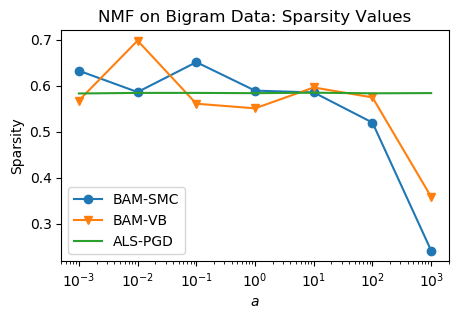

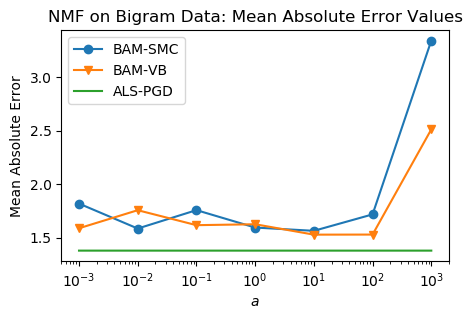

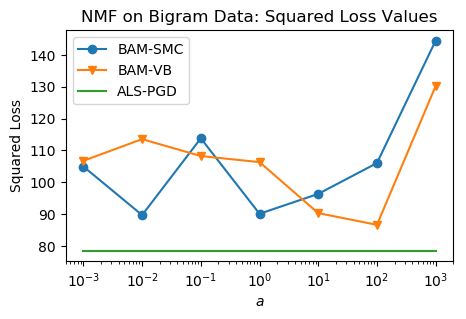

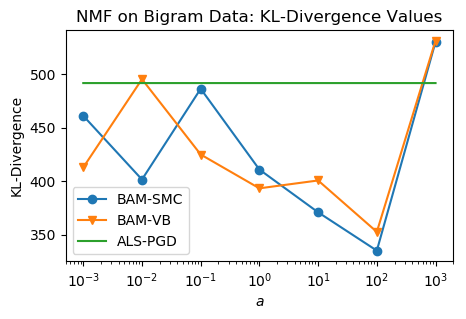

In [120]:
as, N, M, R, EPOCHS = [10.0^c for c in -3:3], 100, 100, 3, 200;
results["as_R_10"] = compare_nmf_vb_alspgd_decomps(X, as, R, N, M;plot=true, if_as=true);

In [10]:
save(File(format"JLD","./results/bigram_decomps.jdl"),"results",results, "datetime", Dates.now())